In [531]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from scipy.stats import norm
import seaborn as sns
import plotly.graph_objects as go

In [662]:
#Stock Properties
S0 = 510.13     #Initial Stock Price
mu=-0.015       #Mean Return
r = 0.0444      #Risk-Free Rate
sigma = 0.25    #BSM Long-Run Volatility
q = 0.0125      #Dividend Rate
#Heston Model Parameters (to be calibrated)
theta = 0.25    #Heston Long-Run Volatility
rho = -0.875    #Brownian Motion Correlations
v_0 = 0.18      #Initial Volatility
xi = 0.28       #Vol. of Vol.
kappa = 12      #Speed of Mean Reversion
#Jump-Diffusion Model Parameters
muJ = 0.1      #Mean Jump Size
sigmaJ = 0.05   #Variance of Shocks/Jumps
lam = 1#Lambda: number of jumps per year
#Option Properties
binary_cash = 10 #For binary options
T = 0.5         #Temporary Time Value
T_vals = np.linspace(0.01, 2, 250) #Time in Years
K_vals = np.linspace(S0-S0*(r+sigma**2/2), S0+S0*(r+sigma**2/2),250) #Strikes
num_simulations = 1_000   #Number of Price Paths
num_steps_multiplier = 252    #Number of Prices to Simulate (for typical yearly prices use 252)

In [663]:
#Barrier Option Parameters
k = 0.9    #Multiplier (to be changed as necessary)
Barrier_Up_Dict = {} #Upper Barrier Price Dictionary
Barrier_Down_Dict = {} #Lower Barrier Price Dictionary
for T in T_vals:
    Barrier_Up_Dict[T] = S0 * np.exp(k * sigma * np.sqrt(T))    #Upper Barrier Price
    Barrier_Down_Dict[T] = S0 * np.exp(k * sigma * np.sqrt(T))  #Lower Barrier Price

In [664]:
#Calculates the d1 component of BSM model
def get_d1(r, K, T, sigma, S0):
    K = np.asarray(K)
    T = np.asarray(T)
    return (np.log(S0 / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))

#Calculates the d2 component of BSM model
def get_d2(r, K, T, sigma, S0):
    return get_d1(r, K, T, sigma, S0) - sigma * np.sqrt(T)

#Calculate the call price according to the BSM (closed-form)
def black_scholes_call(r, K, T, sigma, q, S0):
    d1 = get_d1(r, K, T, sigma, S0)
    d2 = get_d2(r, K, T, sigma, S0)
    return S0 * np.exp(-q * T) * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)

#Calculate the put price according to the BSM (closed-form)
def black_scholes_put(r, K, T, sigma, q, S0):
    d1 = get_d1(r, K, T, sigma, S0)
    d2 = get_d2(r, K, T, sigma, S0)
    return K * np.exp(-r * T) * norm.cdf(-d2) - S0 * np.exp(-q * T) * norm.cdf(-d1)

#Calculate the forward price (closed-form)
def black_scholes_forward(r, T, S0):
    return S0 * np.exp(r * T)

#Calculate the difference between the call and put price
def put_call_parity(r, K, T, sigma, q, S0):
    return black_scholes_call(r, K, T, sigma, q, S0) - black_scholes_put(r, K, T, sigma, q, S0)

#Calculate the straddle price according to the BSM (closed-form)
def black_scholes_straddle(r, K, T, sigma, q, S0):
    return black_scholes_call(r, K, T, sigma, q, S0) + black_scholes_put(r, K, T, sigma, q, S0)

Generate the stock prices for Monte Carlo Simulations

In [665]:
# Using Merton Jump-Diffusion Model for Price & Heston Model for Volatility
def generate_stock_prices(
    S0, T, r, 
    muJ, sigmaJ, lam,     # Merton jump parameters (log-jump ~ N(muJ, sigmaJ^2))
    kappa, theta, v_0, rho, xi,      # Heston parameters
    num_simulations,
    num_steps=None,
    seed=123
):
    if num_steps is None:
        num_steps = int(num_steps_multiplier * T)
    if seed is not None:
        np.random.seed(seed)

    dt = T / num_steps
    sqrt_dt = np.sqrt(dt)

    # Jump compensator to keep the process risk-neutral
    kappaJ = np.exp(muJ + 0.5 * sigmaJ**2) - 1.0

    # Preallocate
    prices = np.empty((num_simulations, num_steps + 1))
    variances = np.empty((num_simulations, num_steps + 1))

    prices[:, 0] = S0
    variances[:, 0] = v_0

    # Correlated Brownian motions per time step
    Z = np.random.randn(num_simulations, num_steps, 2)
    Z1 = Z[:, :, 0]                              # price shock
    Z2 = Z[:, :, 1]                              # to be correlated with Z1 for variance
    Z2 = rho * Z1 + np.sqrt(1.0 - rho**2) * Z2   # impose correlation

    # Poisson jump counts per step
    N = np.random.poisson(lam * dt, size=(num_simulations, num_steps))
    # Sum of N normal jumps: Normal(N*muJ, N*sigmaJ^2)  -> sqrt(N) scaling
    J = np.where(
        N > 0,
        N * muJ + sigmaJ * np.sqrt(N) * np.random.randn(num_simulations, num_steps),
        0.0
    )

    for t in range(1, num_steps + 1):
        vt_prev = variances[:, t - 1]

        # Heston (Euler, full truncation to ensure positivity)
        sqrt_v = np.sqrt(np.maximum(vt_prev, 0.0))
        vt = vt_prev + kappa * (theta - vt_prev) * dt + xi * sqrt_v * sqrt_dt * Z2[:, t - 1]
        vt = np.maximum(vt, 0.0)
        variances[:, t] = vt

        # Log price increment: include jump compensator - lam * kappaJ
        dlogS = (r - 0.5 * vt - lam * kappaJ) * dt + np.sqrt(vt) * sqrt_dt * Z1[:, t - 1] + J[:, t - 1]
        prices[:, t] = prices[:, t - 1] * np.exp(dlogS)

    return prices, variances


Generate the set of stock prices that will be used for all option pricing

In [666]:
prices_dict={}
vol_dict={}
for T in T_vals:
    prices_dict[T],vol_dict[T] = generate_stock_prices(S0, T, r, muJ, sigmaJ, lam, kappa, theta, v_0, rho, xi, num_simulations=num_simulations, num_steps=int(num_steps_multiplier * T))

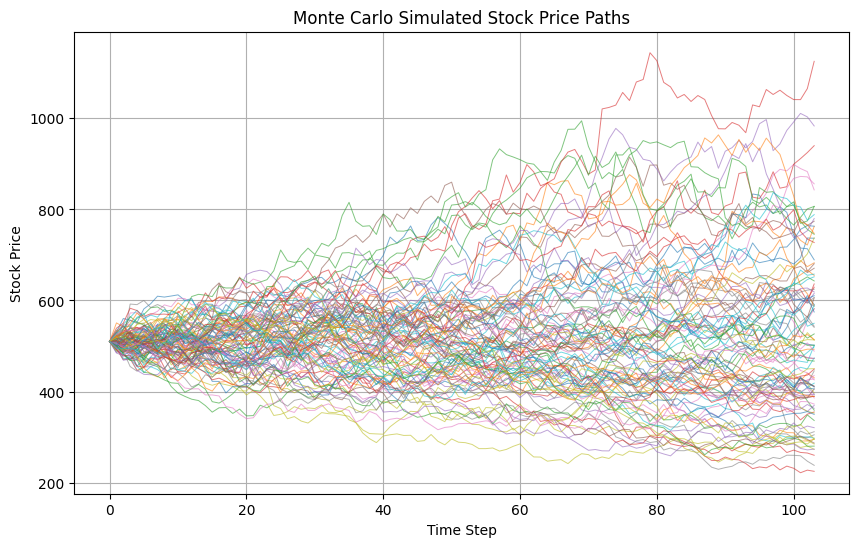

In [667]:
prices_small = prices_dict[T_vals[50]][:100]

plt.figure(figsize=(10, 6))
plt.plot(prices_small.T, linewidth=0.7, alpha=0.6)
plt.title("Monte Carlo Simulated Stock Price Paths")
plt.xlabel("Time Step")
plt.ylabel("Stock Price")
plt.grid(True)
plt.show()

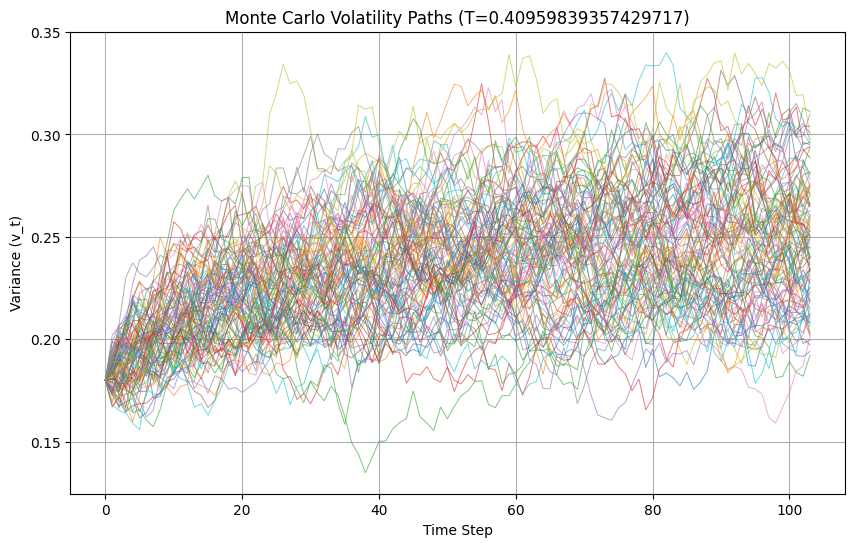

In [668]:
# Select T = T_vals[9]
T_plot = T_vals[50]

# Extract first 1000 volatility paths
vol_small = vol_dict[T_plot][:100]

plt.figure(figsize=(10, 6))
plt.plot(vol_small.T, linewidth=0.7, alpha=0.6)
plt.title(f"Monte Carlo Volatility Paths (T={T_plot})")
plt.xlabel("Time Step")
plt.ylabel("Variance (v_t)")
plt.grid(True)
plt.show()

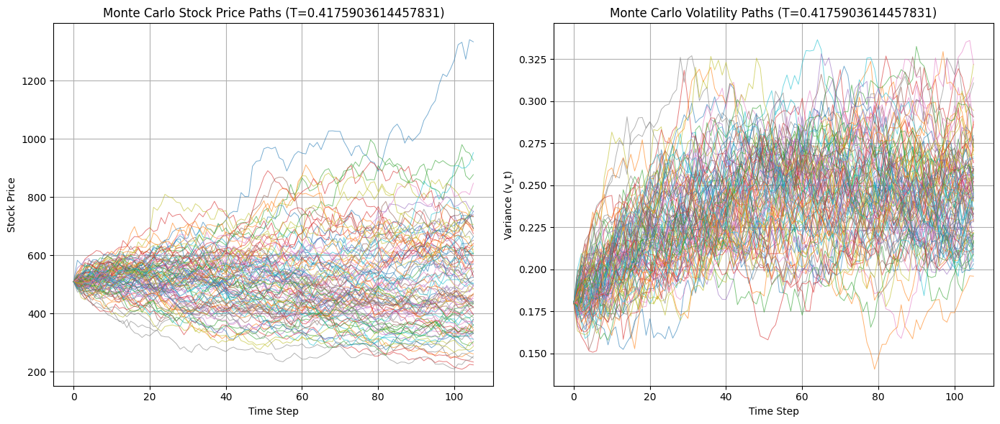

In [669]:
# Select T = T_vals[9]
T_plot = T_vals[51]

# Extract first 1000 paths
prices_small = prices_dict[T_plot][:100]  # Stock prices
vol_small = vol_dict[T_plot][:100]        # Variances (or volatility squared)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# --- Plot Stock Price Paths ---
axes[0].plot(prices_small.T, linewidth=0.7, alpha=0.6)
axes[0].set_title(f"Monte Carlo Stock Price Paths (T={T_plot})")
axes[0].set_xlabel("Time Step")
axes[0].set_ylabel("Stock Price")
axes[0].grid(True)

# --- Plot Volatility Paths ---
axes[1].plot(vol_small.T, linewidth=0.7, alpha=0.6)
axes[1].set_title(f"Monte Carlo Volatility Paths (T={T_plot})")
axes[1].set_xlabel("Time Step")
axes[1].set_ylabel("Variance (v_t)")
axes[1].grid(True)

plt.tight_layout()
plt.show()

Price options using the generated stock prices

In [670]:
def monte_carlo_option_pricing(prices,K, T, r, num_steps=int(num_steps_multiplier * T), option_type='european_call'):
    discount_factor = np.exp(-r * T)

    if option_type == 'european_call' or option_type=="american_call":
        payoffs = np.maximum(prices[:, -1] - K, 0)
        return discount_factor * np.mean(payoffs)

    elif option_type == 'european_put':
        payoffs = np.maximum(K - prices[:, -1], 0)
        return discount_factor * np.mean(payoffs)

    elif option_type == 'asian_call':
        average_price = np.mean(prices[:, 1:], axis=1)
        payoffs = np.maximum(average_price - K, 0)
        return discount_factor * np.mean(payoffs)

    elif option_type == 'asian_put':
        average_price = np.mean(prices[:, 1:], axis=1)
        payoffs = np.maximum(K - average_price, 0)
        return discount_factor * np.mean(payoffs)

    elif option_type == 'american_put':
        # Simplified binomial approximation via dynamic programming (backward induction)
        # For demonstration only; real American option pricing uses Longstaff-Schwartz or binomial trees
        exercise_values = np.maximum(K - prices, 0)
        option_values = exercise_values[:, -1]

        for t in range(num_steps - 1, 0, -1):
            intrinsic = exercise_values[:, t]
            discounted = discount_factor * option_values
            continuation = discounted

            # Early exercise decision
            option_values = np.where(intrinsic > continuation, intrinsic, continuation)

        return np.mean(discount_factor * option_values)
    elif option_type=="straddle":
        call_payoffs=np.maximum(prices[:, -1] - K, 0)
        put_payoffs=np.maximum(K-prices[:, -1], 0)
        return np.mean(call_payoffs+put_payoffs)*discount_factor
    elif option_type == "knock-in_call":
        # Knock-in: include only paths that ever cross Barrier_Up
        valid = np.any(prices >= Barrier_Up_Dict[T], axis=1)
        payoffs = np.maximum(prices[valid, -1] - K, 0)
        if payoffs.size==0:
            return 0
        return np.mean(payoffs) * discount_factor
    
    elif option_type == "knock-out_call":
        # Knock-out: exclude paths that ever cross Barrier_Up
        valid = np.all(prices < Barrier_Up_Dict[T], axis=1)
        payoffs = np.maximum(prices[valid, -1] - K, 0)
        if payoffs.size==0:
            return 0
        return np.mean(payoffs) * discount_factor
    
    elif option_type == "knock-in_put":
        # Knock-in: include only paths that ever go below Barrier_Down
        valid = np.any(prices <= Barrier_Down_Dict[T], axis=1)
        payoffs = np.maximum(K - prices[valid, -1], 0)
        if payoffs.size==0:
            return 0
        return np.mean(payoffs) * discount_factor
    
    elif option_type == "knock-out_put":
        # Knock-out: exclude paths that ever go below Barrier_Down
        valid = np.all(prices > Barrier_Down_Dict[T], axis=1)
        payoffs = np.maximum(K - prices[valid, -1], 0)
        if payoffs.size==0:
            return 0
        return np.mean(payoffs) * discount_factor
    elif option_type == "floating_lookback_call":
        payoffs = np.maximum(prices[:, -1] - np.min(prices, axis=1), 0)
        return np.mean(payoffs) * discount_factor

    elif option_type == "floating_lookback_put":
        payoffs = np.maximum(np.max(prices, axis=1) - prices[:, -1], 0)
        return np.mean(payoffs) * discount_factor
    
    elif option_type == "fixed_lookback_call":
        payoffs = np.maximum(np.max(prices, axis=1) - K, 0)
        return np.mean(payoffs) * discount_factor
    
    elif option_type == "fixed_lookback_put":
        payoffs = np.maximum(K - np.min(prices, axis=1), 0)
        return np.mean(payoffs) * discount_factor
    
    elif option_type=="binary":
        valid = np.all(prices[:,-1]>K)
        payoffs = binary_cash * len(valid)
        return np.mean(payoffs) * discount_factor
   
    
    
    else:
        raise ValueError(f"Unsupported option type: {option_type}")

To be implemented later if necessary for speed

In [671]:
def mc_option_batch(prices, K_array, T, r, option_type):
    discount = np.exp(-r * T)
    S_T = prices[:, -1][:, None]  # shape (n_sim, 1)
    K_array = np.asarray(K_array)[None, :]  # shape (1, n_strikes)

    if option_type == 'european_call':
        payoff = np.maximum(S_T - K_array, 0)
    elif option_type == 'european_put':
        payoff = np.maximum(K_array - S_T, 0)
    elif option_type == 'straddle':
        payoff = np.abs(S_T - K_array)
    elif option_type == 'asian_call':
        avg = np.mean(prices[:, 1:], axis=1)[:, None]
        payoff = np.maximum(avg - K_array, 0)
    elif option_type == 'asian_put':
        avg = np.mean(prices[:, 1:], axis=1)[:, None]
        payoff = np.maximum(K_array - avg, 0)
    else:
        raise ValueError("Option type not supported for vectorized pricing.")
    
    return np.mean(payoff, axis=0) * discount  # shape (n_strikes,)
def mc_knock_call_batch(prices, K_array, T, r, barrier, knock_type='in'):
    discount = np.exp(-r * T)
    K_array = np.asarray(K_array)[None, :]
    S_T = prices[:, -1][:, None]

    if knock_type == 'in':
        valid = np.any(prices >= barrier, axis=1)
    elif knock_type == 'out':
        valid = np.all(prices < barrier, axis=1)
    else:
        raise ValueError("Invalid knock_type")

    if not np.any(valid):
        return np.zeros(K_array.shape[1])

    S_T_valid = S_T[valid]
    payoff = np.maximum(S_T_valid - K_array, 0)
    return np.mean(payoff, axis=0) * discount
def mc_knock_put_batch(prices, K_array, T, r, barrier, knock_type='in'):
    discount = np.exp(-r * T)
    K_array = np.asarray(K_array)[None, :]
    S_T = prices[:, -1][:, None]

    if knock_type == 'in':
        valid = np.any(prices <= barrier, axis=1)
    elif knock_type == 'out':
        valid = np.all(prices > barrier, axis=1)
    else:
        raise ValueError("Invalid knock_type")

    if not np.any(valid):
        return np.zeros(K_array.shape[1])

    S_T_valid = S_T[valid]
    payoff = np.maximum(S_T_valid - K_array, 0)
    return np.mean(payoff, axis=0) * discount


Small scale example of the simulated stock price paths

In [672]:
# Option pricing grid
def build_option_heatmap_grid(option_type):
    grid = np.zeros((len(T_vals), len(K_vals)))
    for i, T in enumerate(T_vals):
        for j, K in enumerate(K_vals):
            price = monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=int(num_steps_multiplier * T), option_type=option_type)
            grid[i, j] = price
    return grid

# Plot heatmap
def plot_heatmap(data, title, T_vals, K_vals):
    plt.figure(figsize=(10, 6))
    sns.heatmap(data, xticklabels=np.round(K_vals, 1), yticklabels=np.round(T_vals, 1), cmap="YlGnBu")
    plt.title(title)
    plt.xlabel("Strike Price (K)")
    plt.ylabel("Time to Maturity (T)")
    plt.tight_layout()
    plt.show()

In [673]:
T_grid, K_grid = np.meshgrid(T_vals, K_vals, indexing='ij')  # shape: (len(T_vals), len(K_vals))

T_flat = T_grid.ravel()
K_flat = K_grid.ravel()

call_prices = black_scholes_call(r, K_flat, T_flat, sigma, q, S0)
put_prices = black_scholes_put(r, K_flat, T_flat, sigma, q, S0)
forward_prices = black_scholes_forward(r, T_flat, S0)
straddle_prices = black_scholes_straddle(r, K_flat, T_flat, sigma, q, S0)
put_call = put_call_parity(r, K_flat, T_flat, sigma, q, S0)

BSM_data = [
    {
        "Final Time": T,
        "Strike Price": K,
        "BSM Euro. Call Price": call,
        "BSM Euro. Put Price": put,
        "BSM Forward Price": fwd,
        "BSM Straddle Price": strd,
        "Put Call Parity": pcp
    }
    for T, K, call, put, fwd, strd, pcp in zip(T_flat, K_flat, call_prices, put_prices, forward_prices, straddle_prices, put_call)
]
BSM_output=pd.DataFrame(BSM_data)

In [674]:
MC_data = []
for T in T_vals:
    for K in K_vals:
        num_steps = int(num_steps_multiplier * T)
        row = {
            "Final Time": T,
            "Strike Price":K,
            "MC Euro. Call Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='european_call'),
            "MC Euro. Put Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='european_put'),
            "MC Asian Call Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='asian_call'),
            "MC Asian Put Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='asian_put'),
            #"MC American Put Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='american_put'),
            "MC Straddle Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='straddle'),
            "MC Knock-In Call Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='knock-in_call'),
            "MC Knock-Out Call Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='knock-out_call'),
            "MC Knock-In Put Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='knock-in_put'),
            "MC Knock-Out Put Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='knock-out_put'),
            "MC Floating Lookback Call Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='floating_lookback_call'),
            "MC Floating Lookback Put Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='floating_lookback_put'),
            "MC Fixed Lookback Call Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='fixed_lookback_call'),
            "MC Fixed Lookback Put Price":monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=num_steps, option_type='fixed_lookback_put')
        }
        MC_data.append(row)
MC_output = pd.DataFrame(MC_data)

In [675]:
option_types = {
    "MC Euro. Call Price": "european_call",
    "MC Euro. Put Price": "european_put",
    "MC Asian Call Price": "asian_call",
    "MC Asian Put Price": "asian_put",
    #"MC American Put Price": "american_put",
    "MC Straddle Price":'straddle',
    "MC Knock-In Call Price":'knock-in_call',
    "MC Knock-Out Call Price":'knock-out_call',
    "MC Knock-In Put Price":'knock-in_put',
    "MC Knock-Out Put Price":'knock-out_put',
    "MC Floating Lookback Call Price":"floating_lookback_call",
    "MC Floating Lookback Put Price":"floating_lookback_put",
    "MC Fixed Lookback Call Price":"fixed_lookback_call",
    "MC Fixed Lookback Put Price":"fixed_lookback_put",
    "MC Binary Option Price":"binary"
}

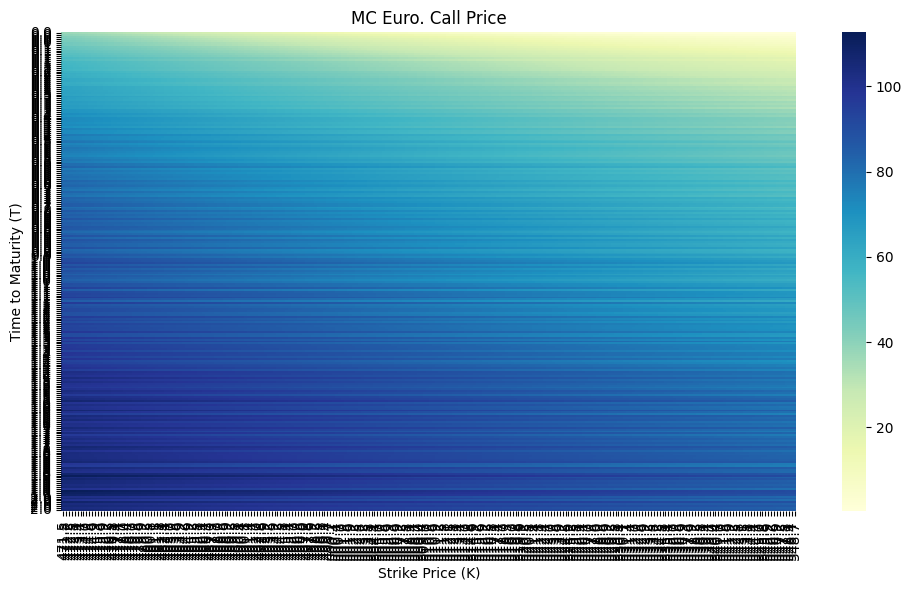

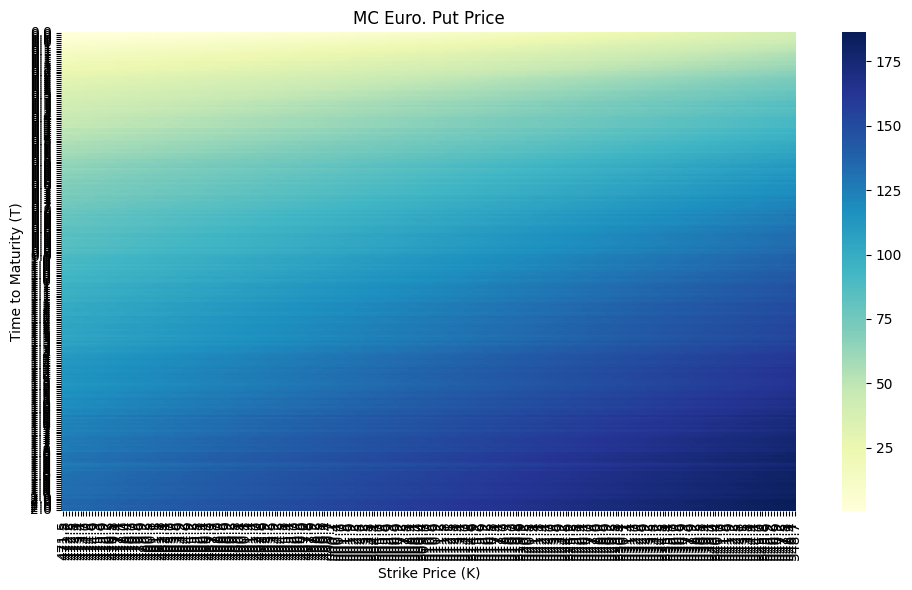

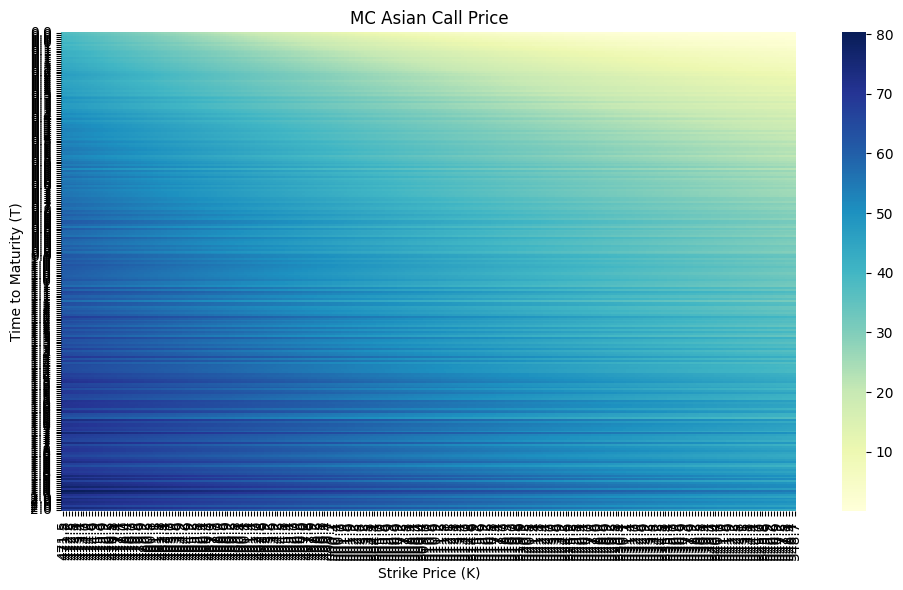

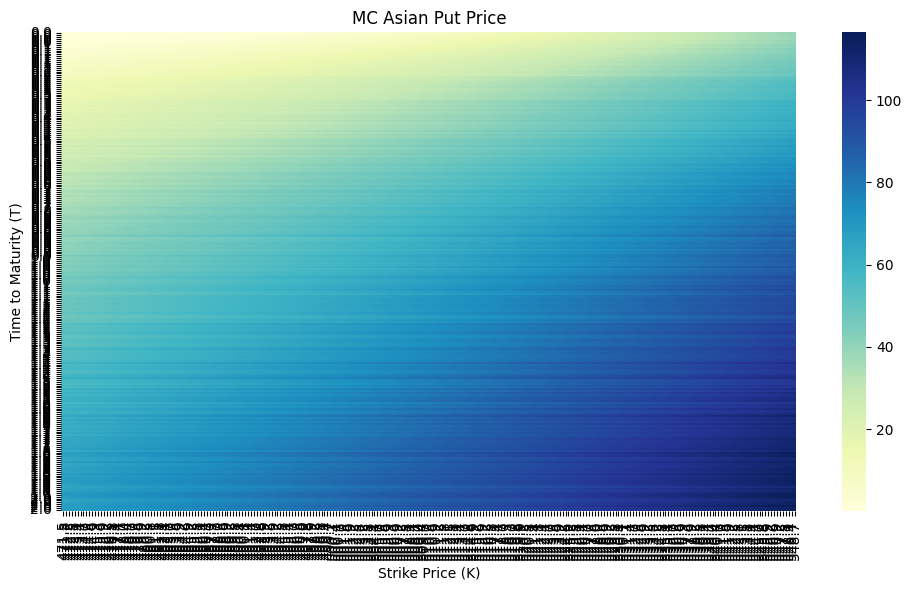

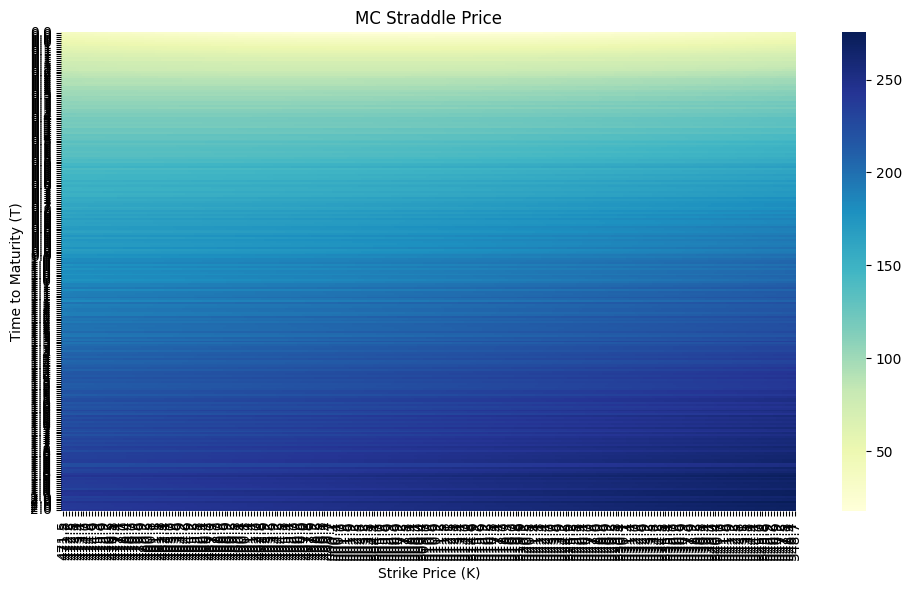

...

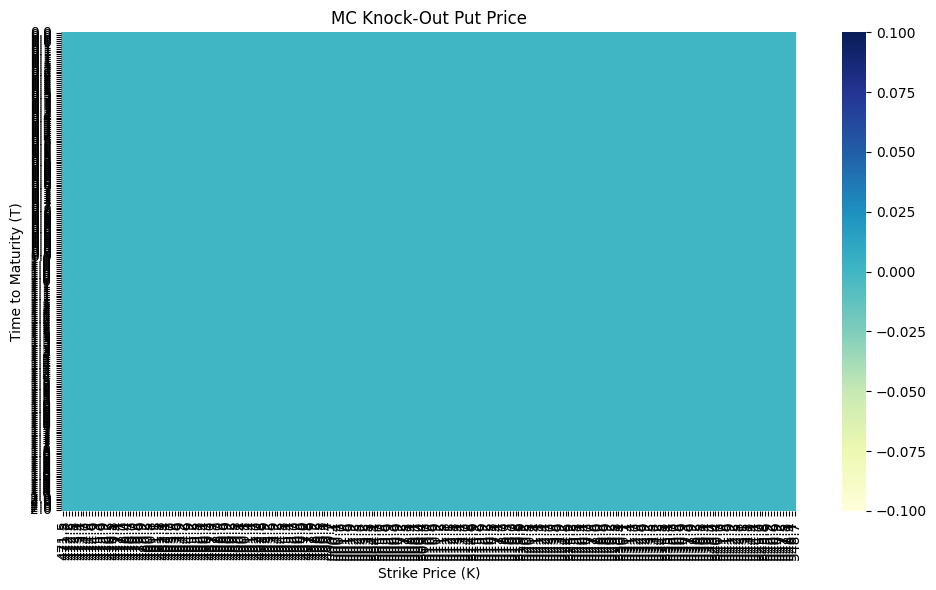

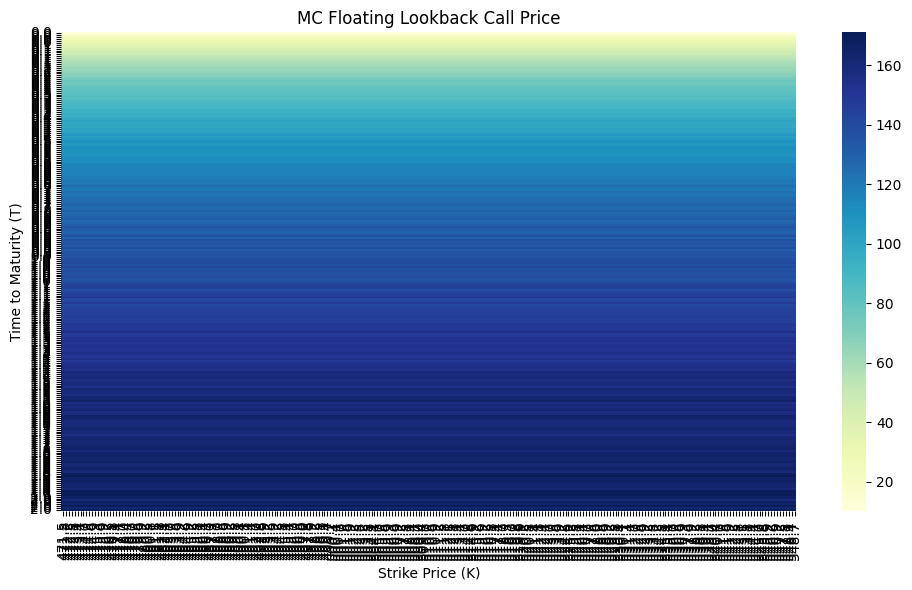

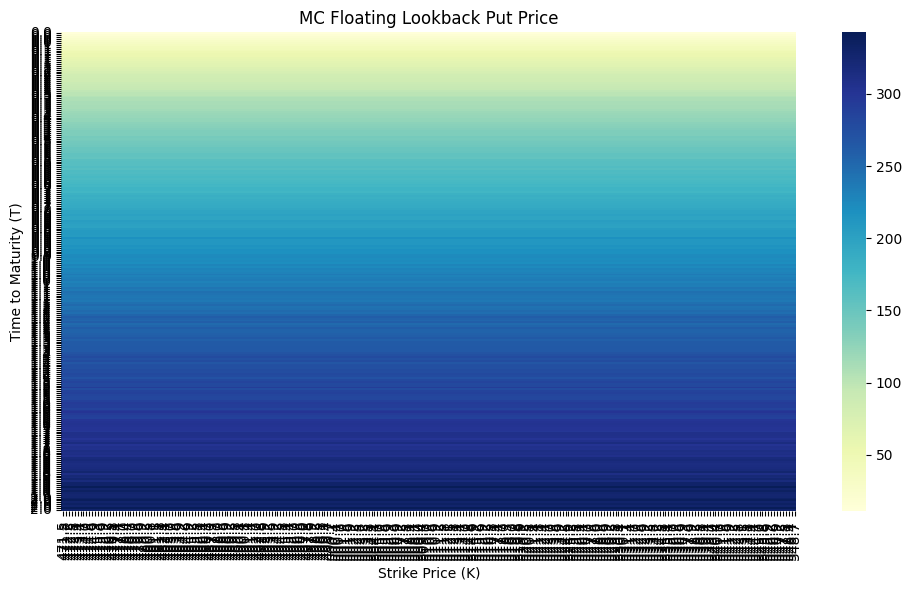

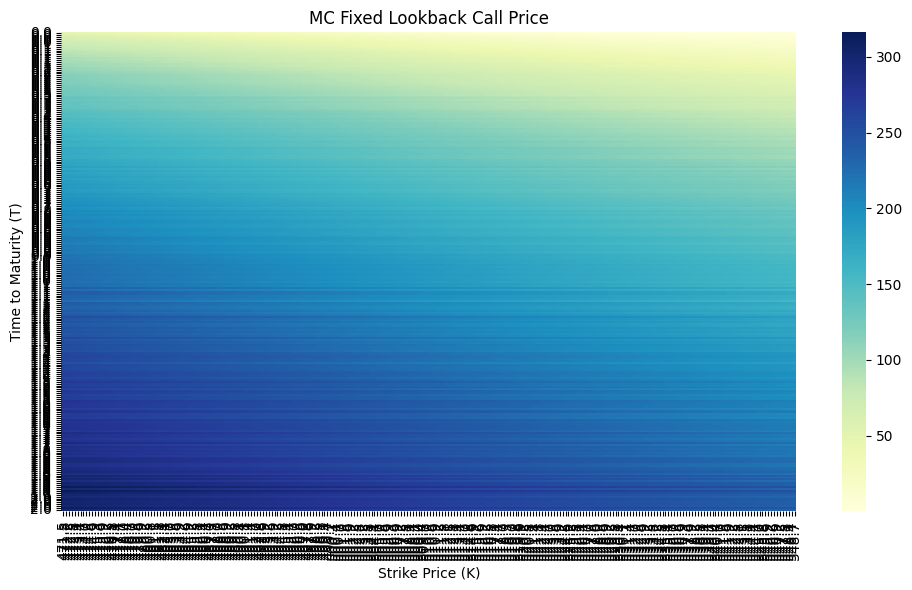

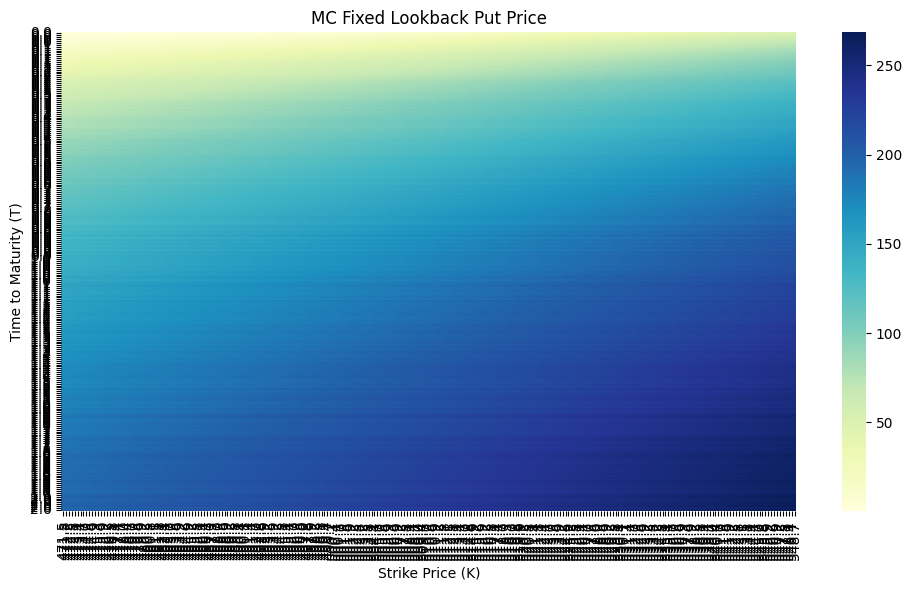

In [676]:
for title, opt_type in option_types.items():
    grid = build_option_heatmap_grid(opt_type)
    plot_heatmap(grid, title, T_vals, K_vals)

In [677]:
T_mesh, K_mesh = np.meshgrid(T_vals, K_vals, indexing='ij')

In [678]:
# Option pricing grid
def build_option_surface(option_type):
    grid = np.zeros_like(T_mesh)
    for i in range(len(T_vals)):
        for j in range(len(K_vals)):
            T = T_vals[i]
            K = K_vals[j]
            grid[i, j] = monte_carlo_option_pricing(prices_dict[T],K, T, r, num_steps=int(num_steps_multiplier * T), option_type=option_type)
    return grid
# Plot 3D surface
def plot_interactive_3d_surface(data, title, T_vals, K_vals):
    fig = go.Figure(data=[go.Surface(z=data, x=K_vals, y=T_vals, colorscale='Viridis')])
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='Strike Price (K)',
            yaxis_title='Time to Maturity (T)',
            zaxis_title='Option Price'
        ),
        autosize=False,
        width=800,
        height=600,
        margin=dict(l=65, r=50, b=65, t=90),
    )
    fig.show()

In [693]:
#Create 3D plots
for label, opt_type in option_types.items():
    print(f"Generating: {label}")
    surface = build_option_surface(opt_type)
    plot_interactive_3d_surface(surface, label, T_vals, K_vals)

Generating: MC Euro. Call Price


Generating: MC Euro. Put Price


Generating: MC Asian Call Price


Generating: MC Asian Put Price


Generating: MC Straddle Price


Generating: MC Knock-In Call Price


Generating: MC Knock-Out Call Price


Generating: MC Knock-In Put Price


Generating: MC Knock-Out Put Price


Generating: MC Floating Lookback Call Price


Generating: MC Floating Lookback Put Price


Generating: MC Fixed Lookback Call Price


Generating: MC Fixed Lookback Put Price


In [690]:
K_filter = K_vals[200]  # Replace with the strike value you want

# Filter the DataFrame for a single strike
BSM_filtered = BSM_output[BSM_output["Strike Price"]==K_filter]
MC_filtered = MC_output[MC_output["Strike Price"] == K_filter]

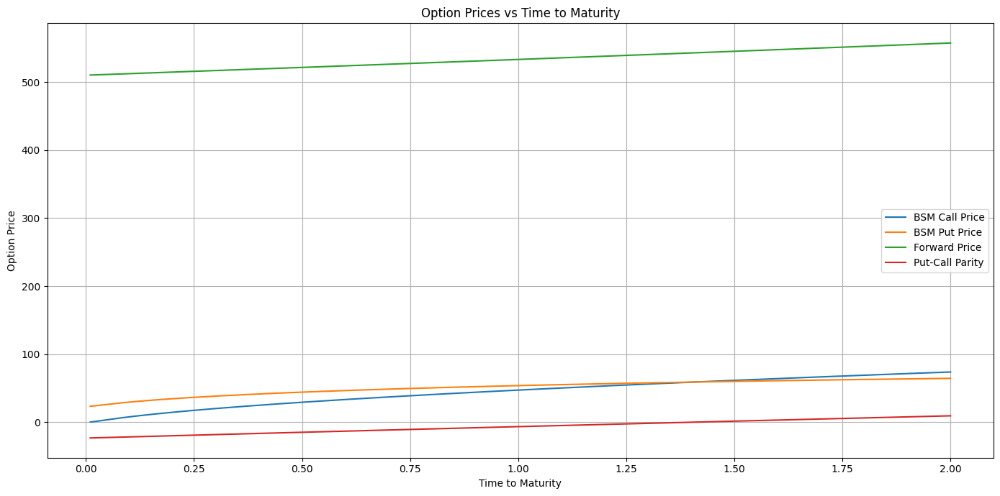

In [691]:
plt.figure(figsize=(14, 7))
plt.plot(BSM_filtered["Final Time"], BSM_filtered["BSM Euro. Call Price"], label="BSM Call Price")
plt.plot(BSM_filtered["Final Time"], BSM_filtered["BSM Euro. Put Price"], label="BSM Put Price")
plt.plot(BSM_filtered["Final Time"], BSM_filtered["BSM Forward Price"], label="Forward Price")
plt.plot(BSM_filtered["Final Time"], BSM_filtered["Put Call Parity"], label="Put-Call Parity")
plt.xlabel("Time to Maturity")
plt.ylabel("Option Price")
plt.title("Option Prices vs Time to Maturity")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

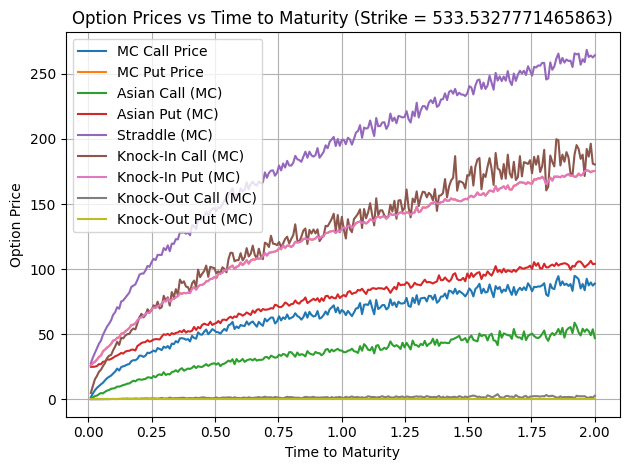

In [692]:
# Plot only this subset
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Euro. Call Price"], label="MC Call Price")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Euro. Put Price"], label="MC Put Price")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Asian Call Price"], label="Asian Call (MC)")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Asian Put Price"], label="Asian Put (MC)")
#plt.plot(MC_filtered["Final Time"], MC_filtered["MC American Put Price"], label="American Put (MC)")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Straddle Price"], label="Straddle (MC)")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Knock-In Call Price"], label="Knock-In Call (MC)")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Knock-In Put Price"], label="Knock-In Put (MC)")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Knock-Out Call Price"], label="Knock-Out Call (MC)")
plt.plot(MC_filtered["Final Time"], MC_filtered["MC Knock-Out Put Price"], label="Knock-Out Put (MC)")

plt.xlabel("Time to Maturity")
plt.ylabel("Option Price")
plt.title(f"Option Prices vs Time to Maturity (Strike = {K_filter})")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
